# Segmentação de Clientes - Banco da Índia

In [107]:
from IPython import display

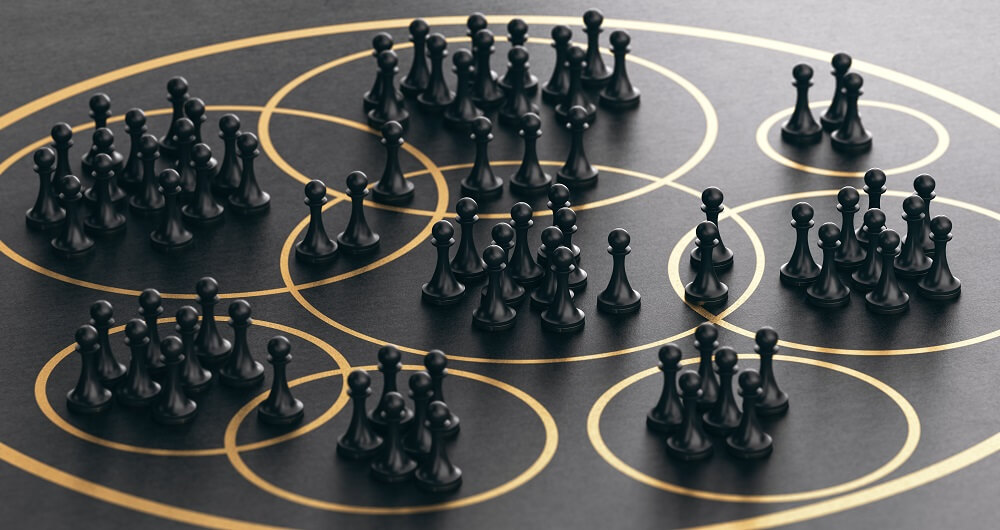

In [108]:
display.Image('../images/customer-segmentation-bank.jpg')

*À medida que aceleramos para um mundo digital, a compreensão dos padrões bancários online dos clientes e a sua segmentação com base nas suas preferências para prever e prestar-lhes serviços bancários tornou-se uma prioridade máxima para os bancos em todo o mundo.*

*A maioria dos bancos tem uma grande base de clientes – com características diferentes em termos de idade, renda, valores, estilo de vida e muito mais. A segmentação de clientes é o processo de divisão de um conjunto de dados de clientes em grupos específicos com base em características compartilhadas.*

*De acordo com um relatório da Ernst & Young, “Uma compreensão mais granular dos consumidores já não é um item interessante, mas um imperativo estratégico e competitivo para os prestadores bancários. A compreensão do cliente deve ser uma parte viva do dia a dia dos negócios, com insights que sustentam toda a gama de operações bancárias.*

# Problema de Negócio

*Os clientes são de natureza diversa e exigem serviços personalizados dos bancos. Por outro lado, os bancos precisam mudar sua mentalidade tradicional e aceitar os novos tipos de preferências dos clientes.*

*Nenhum cliente é obviamente o mesmo, alguns atributos de um cliente podem corresponder a outro cliente, ajudando assim os bancos a servir melhor o segmento de clientes, prevendo os seus desejos e necessidades com bastante antecedência.*

*Os bancos precisam explorar o potencial de compreensão dos dados dos clientes através da segmentação utilizando inteligência artificial e técnicas de aprendizagem automática.*

*A segmentação dos dados dos clientes ajuda os bancos a personalizar as experiências dos clientes, ao mesmo tempo que melhoram e definem os produtos, fazendo com que se adaptem rapidamente às necessidades, hábitos e interesses dos clientes.*

# Sobre a Base de Dados

*Este conjunto de dados consiste em mais de 1 milhão de transações feitas por mais de 800 mil clientes para um banco na Índia. Os dados contêm informações como idade do cliente (DOB), localização, sexo, saldo da conta no momento da transação, detalhes da transação, valor da transação, etc.*

# Análise Exploratória Inicial e Transformação dos Dados

### Dicionário dos Dados

- __TransactionID__ = ID de Transação
- __CustomerID__ = ID de cliente exclusivo
- __CustomerDOB__ = Data de Nascimento
- __CustGender__ = Gênero
- __CustLocation__ = Localização
- __CustAccountBalance__ = Saldo da Conta
- __TransactionDate__ = Data da Transação
- __TransactionTime__ = Hora da Transação
- __TransactionAmount (INR)__ = Valor da Transação em INR - rupia indiana

### Importação das Bibliotecas

In [109]:
import pandas as pd 
import numpy as np
import math

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

from datetime import datetime, date

import warnings
warnings.filterwarnings('ignore')

pd.options.display.float_format = '{:.2f}'.format

import scipy.cluster.hierarchy as sch
import scipy.stats as stats
from scipy.spatial.distance import pdist

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans

### Carregamento do DataSet

In [110]:
df = pd.read_csv('../data/bank_transactions.csv')
df.head()

,TransactionID,CustomerID,CustomerDOB,CustGender,CustLocation,CustAccountBalance,TransactionDate,TransactionTime,TransactionAmount (INR)
0,T1,C5841053,10/1/94,F,JAMSHEDPUR,17819.05,2/8/16,143207,25.00
1,T2,C2142763,4/4/57,M,JHAJJAR,2270.69,2/8/16,141858,27999.00
2,T3,C4417068,26/11/96,F,MUMBAI,17874.44,2/8/16,142712,459.00
3,T4,C5342380,14/9/73,F,MUMBAI,866503.21,2/8/16,142714,2060.00
4,T5,C9031234,24/3/88,F,NAVI MUMBAI,6714.43,2/8/16,181156,1762.50


### Renomear as Variáveis

- Renomear as variáveis para o português seria interessante para termos um melhor entendimento.

In [111]:
df2 = df.copy()

In [112]:
df2.columns

Index(['TransactionID', 'CustomerID', 'CustomerDOB', 'CustGender',
       'CustLocation', 'CustAccountBalance', 'TransactionDate',
       'TransactionTime', 'TransactionAmount (INR)'],
      dtype='object')

In [113]:
df2.rename(columns = {'TransactionID':'id_transacao', 
                      'CustomerID':'id_cliente', 
                      'CustomerDOB':'data_de_nascimento', 
                      'CustGender':'genero',
                      'CustLocation':'localizacao', 
                      'CustAccountBalance':'saldo_da_conta', 
                      'TransactionDate':'data_da_transacao',
                      'TransactionTime':'hora_da_transacao', 
                      'TransactionAmount (INR)':'valor_da_transacao_INR'}, inplace = True)

In [114]:
df2.head()

,id_transacao,id_cliente,data_de_nascimento,genero,localizacao,saldo_da_conta,data_da_transacao,hora_da_transacao,valor_da_transacao_INR
0,T1,C5841053,10/1/94,F,JAMSHEDPUR,17819.05,2/8/16,143207,25.00
1,T2,C2142763,4/4/57,M,JHAJJAR,2270.69,2/8/16,141858,27999.00
2,T3,C4417068,26/11/96,F,MUMBAI,17874.44,2/8/16,142712,459.00
3,T4,C5342380,14/9/73,F,MUMBAI,866503.21,2/8/16,142714,2060.00
4,T5,C9031234,24/3/88,F,NAVI MUMBAI,6714.43,2/8/16,181156,1762.50


### Informações do DataSet

In [115]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048567 entries, 0 to 1048566
Data columns (total 9 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   id_transacao            1048567 non-null  object 
 1   id_cliente              1048567 non-null  object 
 2   data_de_nascimento      1045170 non-null  object 
 3   genero                  1047467 non-null  object 
 4   localizacao             1048416 non-null  object 
 5   saldo_da_conta          1046198 non-null  float64
 6   data_da_transacao       1048567 non-null  object 
 7   hora_da_transacao       1048567 non-null  int64  
 8   valor_da_transacao_INR  1048567 non-null  float64
dtypes: float64(2), int64(1), object(6)
memory usage: 72.0+ MB


- Nesse primeiro momento, podemos ver que existem varíaveis do tipo categórica, e variáveis do tipo numérica:
    - categórica: id_transacao, id_cliente, genero, localizacao.
    - numérica: data_de_nascimento, saldo_da_conta, data_da_transacao, hora_da_transacao e valor_da_transacao_INR.
- E há variáveis com valores ausentes, no caso são as variáveis:
    - data_de_nascimento, genero, localizacao e saldo_da_conta.  


In [116]:
df2.shape

(1048567, 9)

- O Dataset possui 1.048.567 linhas, e 9 colunas nesse primeiro momento.

### Valores Ausentes - Missing Values

In [117]:
valores_ausentes = df2.isna().sum().sort_values(ascending=False)
valores_ausentes

data_de_nascimento        3397
saldo_da_conta            2369
genero                    1100
localizacao                151
id_transacao                 0
id_cliente                   0
data_da_transacao            0
hora_da_transacao            0
valor_da_transacao_INR       0
dtype: int64

In [118]:
valores_ausentes_percent = valores_ausentes[valores_ausentes > 0] / df2.shape[0]
print(f'{valores_ausentes_percent * 100} % ')

data_de_nascimento   0.32
saldo_da_conta       0.23
genero               0.10
localizacao          0.01
dtype: float64 % 


- Como já mencionado antes, as variáveis data_de_nascimento, genero, localizacao e saldo_da_conta possuem valores ausentes consideráveis.


### Dados Duplicados

In [119]:
df2.duplicated().sum()

np.int64(0)

- Podemos ver que a base de dados não possui valores duplicados.

### Transformação de variáveis

- Analisando o Dataset, podemos observar que data_de_nascimento, e data_de_transacao estão no formato do tipo object, seria ideal fazer uma transformação para o tipo de dado correto, nesse caso, o tipo datetime, afinal são datas.

In [120]:
df2['data_de_nascimento'] = pd.to_datetime(df2['data_de_nascimento'], errors='coerce', format = 'mixed')
df2['data_da_transacao'] = pd.to_datetime(df2['data_da_transacao'], errors='coerce', format = 'mixed')


- Observei uma possível transformação na variável hora_da_transacao. As informações estão um pouco confusas, pensando nisso, tive a idéia de criar uma nova variável, pegando os valores da hora de transação para criar o período do dia de transação:
    - manhã
    - tarde
    - noite
    - madrugada
    - indefinido
- Com isso, acredito que seria mais fácil a continuação da análise exploratória.

In [121]:
df2.head(20)

,id_transacao,id_cliente,data_de_nascimento,genero,localizacao,saldo_da_conta,data_da_transacao,hora_da_transacao,valor_da_transacao_INR
0,T1,C5841053,1994-10-01,F,JAMSHEDPUR,17819.05,2016-02-08,143207,25.00
1,T2,C2142763,2057-04-04,M,JHAJJAR,2270.69,2016-02-08,141858,27999.00
2,T3,C4417068,1996-11-26,F,MUMBAI,17874.44,2016-02-08,142712,459.00
3,T4,C5342380,2073-09-14,F,MUMBAI,866503.21,2016-02-08,142714,2060.00
4,T5,C9031234,1988-03-24,F,NAVI MUMBAI,6714.43,2016-02-08,181156,1762.50
5,T6,C1536588,2072-08-10,F,ITANAGAR,53609.20,2016-02-08,173940,676.00
6,T7,C7126560,1992-01-26,F,MUMBAI,973.46,2016-02-08,173806,566.00
7,T8,C1220223,1982-01-27,M,MUMBAI,95075.54,2016-02-08,170537,148.00
8,T9,C8536061,1988-04-19,F,GURGAON,14906.96,2016-02-08,192825,833.00
9,T10,C6638934,1984-06-22,M,MUMBAI,4279.22,2016-02-08,192446,289.11


In [122]:
def periodo_do_dia(hora):
    if hora > 60000 and hora < 120000:
        return 'manha'
    elif hora > 120000 and hora < 180000:
        return 'tarde'
    elif hora > 180000:
        return 'noite'
    elif hora > 0 and hora < 60000:
        return 'madrugada'
    else:
        return 'indefinido'

df2['periodo_do_dia_da_transacao'] = df2.hora_da_transacao.apply(periodo_do_dia)


In [123]:
df2.head()

,id_transacao,id_cliente,data_de_nascimento,genero,localizacao,saldo_da_conta,data_da_transacao,hora_da_transacao,valor_da_transacao_INR,periodo_do_dia_da_transacao
0,T1,C5841053,1994-10-01,F,JAMSHEDPUR,17819.05,2016-02-08,143207,25.00,tarde
1,T2,C2142763,2057-04-04,M,JHAJJAR,2270.69,2016-02-08,141858,27999.00,tarde
2,T3,C4417068,1996-11-26,F,MUMBAI,17874.44,2016-02-08,142712,459.00,tarde
3,T4,C5342380,2073-09-14,F,MUMBAI,866503.21,2016-02-08,142714,2060.00,tarde
4,T5,C9031234,1988-03-24,F,NAVI MUMBAI,6714.43,2016-02-08,181156,1762.50,noite


In [124]:
df2['periodo_do_dia_da_transacao'].value_counts()

periodo_do_dia_da_transacao
noite         436159
tarde         390869
manha         174471
madrugada      47028
indefinido        40
Name: count, dtype: int64

- Na variável data_de_nascimento, vi que existem datas de nascimento fora da realidade. Um exemplo, clientes nascidos em 1800 e 2057, claramente é um erro, pra consertar coloquei um metódo apply para pegar as variáveis maiores que 2016 e menores que 1900, e subtrair 100 anos e somei 100 anos, ficando no caso:
    
    - 2057 - 100 = 1957
    - 1800 + 100 = 1900

In [125]:
df2.data_de_nascimento.unique()

<DatetimeArray>
['1994-10-01 00:00:00', '2057-04-04 00:00:00', '1996-11-26 00:00:00',
 '2073-09-14 00:00:00', '1988-03-24 00:00:00', '2072-08-10 00:00:00',
 '1992-01-26 00:00:00', '1982-01-27 00:00:00', '1988-04-19 00:00:00',
 '1984-06-22 00:00:00',
 ...
 '2057-10-13 00:00:00', '2044-07-30 00:00:00', '2005-08-15 00:00:00',
 '2046-06-04 00:00:00', '2050-07-01 00:00:00', '2015-11-18 00:00:00',
 '2045-06-28 00:00:00', '2065-07-18 00:00:00', '2042-05-15 00:00:00',
 '2044-10-24 00:00:00']
Length: 17255, dtype: datetime64[ns]

In [126]:
df2['data_de_nascimento'] = df2.apply(lambda x: x['data_de_nascimento'].year - 100 if x['data_de_nascimento'].year > 2016 else (x['data_de_nascimento'].year + 100\
        if x['data_de_nascimento'].year < 1900 else x['data_de_nascimento'].year) , axis = 1)

- Variável data_de_nascimento transformada.

In [127]:
df2.data_de_nascimento.unique()

array([1994., 1957., 1996., 1973., 1988., 1972., 1992., 1982., 1984.,
       1978., 1968., 1900., 1989., 1991., 1985., 1993., 1986., 1967.,
       1979., 1977., 1997., 1983., 1990., 1980., 1981., 1966., 1987.,
       1975., 1995., 1974., 1971., 1932., 1959.,   nan, 1999., 1965.,
       1941., 1954., 1970., 1976., 1921., 1969., 2004., 1943., 1998.,
       1951., 1960., 1956., 1953., 1947., 2000., 1964., 1948., 1962.,
       1952., 1955., 1961., 1936., 1963., 1942., 1944., 1938., 2002.,
       1949., 1958., 1950., 1946., 1945., 1937., 2007., 2001., 1939.,
       1940., 2013., 2003., 2005., 2010., 2011., 1933., 1934., 1927.,
       1919., 1928., 1930., 2009., 1931., 1929., 1935., 2015., 2016.,
       2006., 2008., 2012., 1923., 1926., 1924., 1922., 2014., 1920.,
       1925., 1918.])

- Com a transformação feita acima nas datas de nascimento, vi que seria ideal criar uma variável com a idade de cada cliente no ano de 2016, ano em que foi contabilizado esses registros, para melhorar a análise exploratória.

In [128]:
df2['idade_em_2016'] = df2['data_da_transacao'].dt.year - df2['data_de_nascimento']

In [129]:
df2['idade_em_2016'].unique()

array([ 22.,  59.,  20.,  43.,  28.,  44.,  24.,  34.,  32.,  38.,  48.,
       116.,  27.,  25.,  31.,  23.,  30.,  49.,  37.,  39.,  19.,  33.,
        26.,  36.,  35.,  50.,  29.,  41.,  21.,  42.,  45.,  84.,  57.,
        nan,  17.,  51.,  75.,  62.,  46.,  40.,  95.,  47.,  12.,  73.,
        18.,  65.,  56.,  60.,  63.,  69.,  16.,  52.,  68.,  54.,  64.,
        61.,  55.,  80.,  53.,  74.,  72.,  78.,  14.,  67.,  58.,  66.,
        70.,  71.,  79.,   9.,  15.,  77.,  76.,   3.,  13.,  11.,   6.,
         5.,  83.,  82.,  89.,  97.,  88.,  86.,   7.,  85.,  87.,  81.,
         1.,   0.,  10.,   8.,   4.,  93.,  90.,  92.,  94.,   2.,  96.,
        91.,  98.])

- Analisando as variáveis saldo_da_conta e valor_da_transacao_INR, vi que seria ideal criar uma variável chamada saldo_situacao, mostrando os clientes que possuem saldo_negativo, e os que possuem saldo_positivo.
- Agrupar esses registros dessa forma pode ser interessante para melhorar a análise e a clusterização.

In [130]:
df2.head()

,id_transacao,id_cliente,data_de_nascimento,genero,localizacao,saldo_da_conta,data_da_transacao,hora_da_transacao,valor_da_transacao_INR,periodo_do_dia_da_transacao,idade_em_2016
0,T1,C5841053,1994.00,F,JAMSHEDPUR,17819.05,2016-02-08,143207,25.00,tarde,22.00
1,T2,C2142763,1957.00,M,JHAJJAR,2270.69,2016-02-08,141858,27999.00,tarde,59.00
2,T3,C4417068,1996.00,F,MUMBAI,17874.44,2016-02-08,142712,459.00,tarde,20.00
3,T4,C5342380,1973.00,F,MUMBAI,866503.21,2016-02-08,142714,2060.00,tarde,43.00
4,T5,C9031234,1988.00,F,NAVI MUMBAI,6714.43,2016-02-08,181156,1762.50,noite,28.00


In [131]:
condicoes_saldo = [
    df2['saldo_da_conta'] <= df2['valor_da_transacao_INR'],
    df2['saldo_da_conta'] >= df2['valor_da_transacao_INR']
]

categorias_saldo = ['saldo_negativo', 'saldo_positivo']

df2['saldo_situacao'] = np.select(condicoes_saldo, categorias_saldo, default='saldo_positivo')

In [132]:
df2.head()

,id_transacao,id_cliente,data_de_nascimento,genero,localizacao,saldo_da_conta,data_da_transacao,hora_da_transacao,valor_da_transacao_INR,periodo_do_dia_da_transacao,idade_em_2016,saldo_situacao
0,T1,C5841053,1994.00,F,JAMSHEDPUR,17819.05,2016-02-08,143207,25.00,tarde,22.00,saldo_positivo
1,T2,C2142763,1957.00,M,JHAJJAR,2270.69,2016-02-08,141858,27999.00,tarde,59.00,saldo_negativo
2,T3,C4417068,1996.00,F,MUMBAI,17874.44,2016-02-08,142712,459.00,tarde,20.00,saldo_positivo
3,T4,C5342380,1973.00,F,MUMBAI,866503.21,2016-02-08,142714,2060.00,tarde,43.00,saldo_positivo
4,T5,C9031234,1988.00,F,NAVI MUMBAI,6714.43,2016-02-08,181156,1762.50,noite,28.00,saldo_positivo


- Nesse caso, optei em excluir essas variáveis por serem menos importantes para a análise.

In [133]:
df2.drop(columns = ['data_de_nascimento', 'hora_da_transacao'], inplace = True)

In [134]:
df2.head()

,id_transacao,id_cliente,genero,localizacao,saldo_da_conta,data_da_transacao,valor_da_transacao_INR,periodo_do_dia_da_transacao,idade_em_2016,saldo_situacao
0,T1,C5841053,F,JAMSHEDPUR,17819.05,2016-02-08,25.00,tarde,22.00,saldo_positivo
1,T2,C2142763,M,JHAJJAR,2270.69,2016-02-08,27999.00,tarde,59.00,saldo_negativo
2,T3,C4417068,F,MUMBAI,17874.44,2016-02-08,459.00,tarde,20.00,saldo_positivo
3,T4,C5342380,F,MUMBAI,866503.21,2016-02-08,2060.00,tarde,43.00,saldo_positivo
4,T5,C9031234,F,NAVI MUMBAI,6714.43,2016-02-08,1762.50,noite,28.00,saldo_positivo


- optei em criar duas colunas, dia e mês para melhorar os insights.

In [135]:
df2['dia'] = df2['data_da_transacao'].dt.day_name()
df2['mes'] = df2['data_da_transacao'].dt.month_name()

In [136]:
df2.head()

,id_transacao,id_cliente,genero,localizacao,saldo_da_conta,data_da_transacao,valor_da_transacao_INR,periodo_do_dia_da_transacao,idade_em_2016,saldo_situacao,dia,mes
0,T1,C5841053,F,JAMSHEDPUR,17819.05,2016-02-08,25.00,tarde,22.00,saldo_positivo,Monday,February
1,T2,C2142763,M,JHAJJAR,2270.69,2016-02-08,27999.00,tarde,59.00,saldo_negativo,Monday,February
2,T3,C4417068,F,MUMBAI,17874.44,2016-02-08,459.00,tarde,20.00,saldo_positivo,Monday,February
3,T4,C5342380,F,MUMBAI,866503.21,2016-02-08,2060.00,tarde,43.00,saldo_positivo,Monday,February
4,T5,C9031234,F,NAVI MUMBAI,6714.43,2016-02-08,1762.50,noite,28.00,saldo_positivo,Monday,February


### Imput Missing utilizando a detecção de Outliers

- Vamos começar olhando para as variáveis que têm o maior percentual de valores ausentes.
- No caso vamos escolher as variáveis com mais de 5% de valores missing.

In [137]:
valores_ausentes = df2.isna().sum().sort_values(ascending=False)
valores_ausentes

idade_em_2016                  3397
saldo_da_conta                 2369
genero                         1100
localizacao                     151
id_transacao                      0
id_cliente                        0
valor_da_transacao_INR            0
data_da_transacao                 0
periodo_do_dia_da_transacao       0
saldo_situacao                    0
dia                               0
mes                               0
dtype: int64

In [138]:
valores_ausentes_percent = valores_ausentes[valores_ausentes > 0] / df2.shape[0]
print(f'{valores_ausentes_percent * 100} %')

idade_em_2016    0.32
saldo_da_conta   0.23
genero           0.10
localizacao      0.01
dtype: float64 %


In [139]:
fig = px.box(df2, y="idade_em_2016")
fig.show()

In [140]:
# Atributos numéricos com mais de 5% de valores missing
vars_num_mais_de_5_por_cento_de_missing = ['idade_em_2016', 'saldo_da_conta']

# Criar um novo dataframe
novo_dataframe = df2[vars_num_mais_de_5_por_cento_de_missing]

# Identificação de outliers através do método do IQR (Interquatile Range)
Q1 = novo_dataframe.quantile(0.25)
Q3 = novo_dataframe.quantile(0.75)
IQR = Q3 - Q1

# Definir outliers como aqueles valores que estão fora do intervalo [Q1 - 1.5 * IQR, Q3 + 1.5 * IQR]
outliers_numericos_com_NA_maior_que_5_por_cento = ((novo_dataframe < (Q1 - 1.5 * IQR)) | (novo_dataframe > (Q3 + 1.5 * IQR)))

# Total de outliers
outliers_numericos_com_NA_maior_que_5_por_cento.head(20)

,idade_em_2016,saldo_da_conta
0,False,False
1,True,False
2,False,False
3,False,True
4,False,False
5,False,False
6,False,False
7,False,False
8,False,False
9,False,False


In [141]:
novo_dataframe.head(20)

,idade_em_2016,saldo_da_conta
0,22.00,17819.05
1,59.00,2270.69
2,20.00,17874.44
3,43.00,866503.21
4,28.00,6714.43
5,44.00,53609.20
6,24.00,973.46
7,34.00,95075.54
8,28.00,14906.96
9,32.00,4279.22


In [142]:
# Função para o Replace das linhas vazias com a mediana
def impute_median(dados):
    return dados.fillna(dados.median())

In [143]:
for i in df2[vars_num_mais_de_5_por_cento_de_missing]:
    print(i)
    df2[i] = df2[i].transform(impute_median)

idade_em_2016
saldo_da_conta


In [144]:
df2.isna().sum()

id_transacao                      0
id_cliente                        0
genero                         1100
localizacao                     151
saldo_da_conta                    0
data_da_transacao                 0
valor_da_transacao_INR            0
periodo_do_dia_da_transacao       0
idade_em_2016                     0
saldo_situacao                    0
dia                               0
mes                               0
dtype: int64

In [145]:
vars_cat_ate_10_por_cento_de_missing = ['genero', 'localizacao']


for i in df2[vars_cat_ate_10_por_cento_de_missing]:
    df2[i].fillna(df2[i].value_counts().index[0], inplace=True)


In [146]:
df2.isna().sum()

id_transacao                   0
id_cliente                     0
genero                         0
localizacao                    0
saldo_da_conta                 0
data_da_transacao              0
valor_da_transacao_INR         0
periodo_do_dia_da_transacao    0
idade_em_2016                  0
saldo_situacao                 0
dia                            0
mes                            0
dtype: int64

### Verificação de Dados Duplicados

In [147]:
df2.duplicated().sum()

np.int64(0)

### Describe


In [148]:
# divisão das variáveis numéricas e categóricas

num_vars = df2.select_dtypes(include=np.number)
cat_vars = df2.select_dtypes(exclude=np.number)

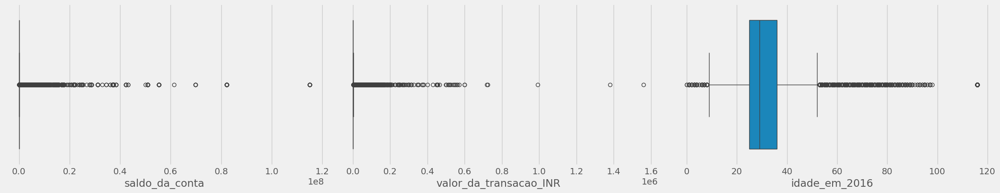

In [149]:
# Variáveis Numéricas

plt.style.use("fivethirtyeight")
plt.figure(figsize=(30,30))
for index,column in enumerate(num_vars):
    plt.subplot(7,4,index+1)
    sns.boxplot(data=num_vars,x=column)
    
plt.tight_layout(pad = 1.0)

In [150]:
# Variáveis Numéricas

num_vars.describe()

,saldo_da_conta,valor_da_transacao_INR,idade_em_2016
count,1048567.00,1048567.00,1048567.00
mean,115180.75,1574.34,35.67
std,845541.58,6574.74,21.11
min,0.00,0.00,0.00
25%,4740.20,161.00,25.00
50%,16792.18,459.03,29.00
75%,57472.88,1200.00,36.00
max,115035495.10,1560034.99,116.00


In [151]:
# Variáveis Categóricas

cat_vars.describe(include='object')

,id_transacao,id_cliente,genero,localizacao,periodo_do_dia_da_transacao,saldo_situacao,dia,mes
count,1048567,1048567,1048567,1048567,1048567,1048567,1048567,1048567
unique,1048567,884265,3,9355,5,2,7,12
top,T1048567,C3226689,M,MUMBAI,noite,saldo_positivo,Tuesday,August
freq,1,6,766630,103746,436159,945005,170318,430314


### Dataset Limpo

In [152]:
# Cópia do Dataset

df3 = df2.copy()

In [153]:
df3.head()

,id_transacao,id_cliente,genero,localizacao,saldo_da_conta,data_da_transacao,valor_da_transacao_INR,periodo_do_dia_da_transacao,idade_em_2016,saldo_situacao,dia,mes
0,T1,C5841053,F,JAMSHEDPUR,17819.05,2016-02-08,25.00,tarde,22.00,saldo_positivo,Monday,February
1,T2,C2142763,M,JHAJJAR,2270.69,2016-02-08,27999.00,tarde,59.00,saldo_negativo,Monday,February
2,T3,C4417068,F,MUMBAI,17874.44,2016-02-08,459.00,tarde,20.00,saldo_positivo,Monday,February
3,T4,C5342380,F,MUMBAI,866503.21,2016-02-08,2060.00,tarde,43.00,saldo_positivo,Monday,February
4,T5,C9031234,F,NAVI MUMBAI,6714.43,2016-02-08,1762.50,noite,28.00,saldo_positivo,Monday,February


### Análise Exploratória Bivariada


**Gênero e Localização**

Text(0.5, 1.0, 'Top 10 Localizações')

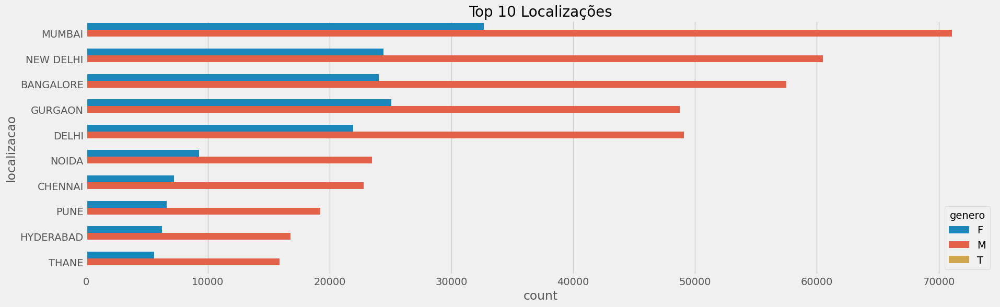

In [154]:
plt.figure(figsize=(20,6))
sns.countplot(y='localizacao',data=df3,
              order = df3['localizacao'].value_counts()[:10].index, hue = 'genero')
plt.title("Top 10 Localizações",fontsize='20')

- Em Mumbai, Bangalore, e Nova Delhi são as 3 primeiras cidades com maior frequência de transações, com a maioria masculina.

**Gênero e Periodo do dia da transação**

Text(0.5, 1.0, 'Período do Dia da Transação x Gênero')

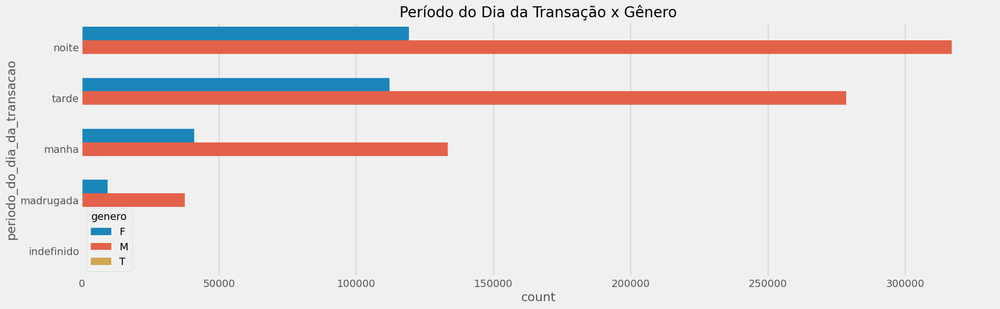

In [155]:
plt.figure(figsize=(20,6))
sns.countplot(y='periodo_do_dia_da_transacao',data=df3,
              order = df3['periodo_do_dia_da_transacao'].value_counts().index, hue = 'genero')
plt.title("Período do Dia da Transação x Gênero",fontsize='20')

- Noite foi o período do dia com mais frequências de transações com predominância do sexo masculino.

**Gênero e Idade**

<Axes: xlabel='genero', ylabel='idade_em_2016'>

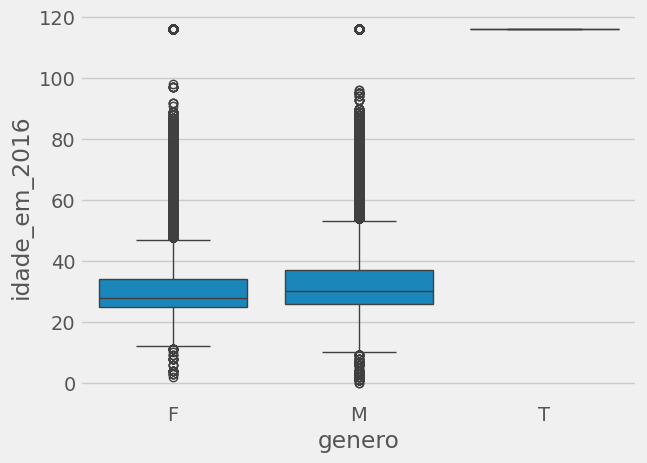

In [156]:
sns.boxplot(x=df3['genero'] ,y= df3['idade_em_2016'])

- As idades em ambos os sexos estão distribuidas praticamente iguais.
- Q1(25%) dos dados estão com 25 anos.
- Q2(50% - Mediana) dos dados estão entre 28 e 29 anos.
- Q3(75%) dos dados estão entre 33 e 35 anos.
- Nos limites inferior temos idades de 13 anos e 10 anos.
- Nos limites superior temos idades de 45 anos e 50 anos.

**Gênero e Saldo Situação**

Text(0.5, 1.0, 'Top 10 Saldo Situação x Gênero')

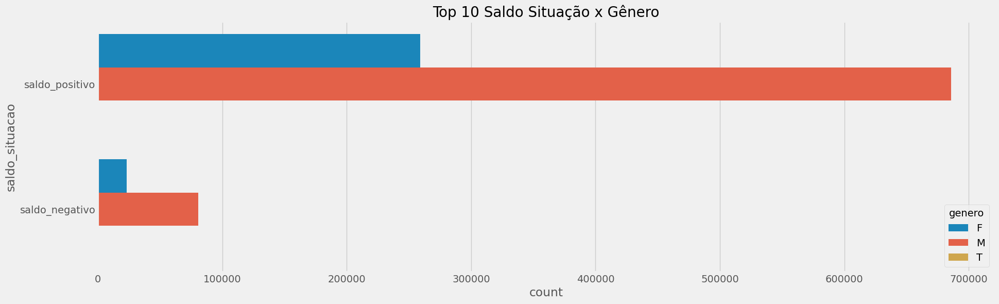

In [157]:
plt.figure(figsize=(20,6))
sns.countplot(y='saldo_situacao',data=df3,
              order = df3['saldo_situacao'].value_counts()[:10].index, hue = 'genero')
plt.title("Top 10 Saldo Situação x Gênero",fontsize='20')

- O saldo positivo é bem superior ao saldo negativo, e novamente mais frequente entre os homens.

**Gênero e Valor da Transação**

Text(0.5, 1.0, 'Valor da transação por gênero')

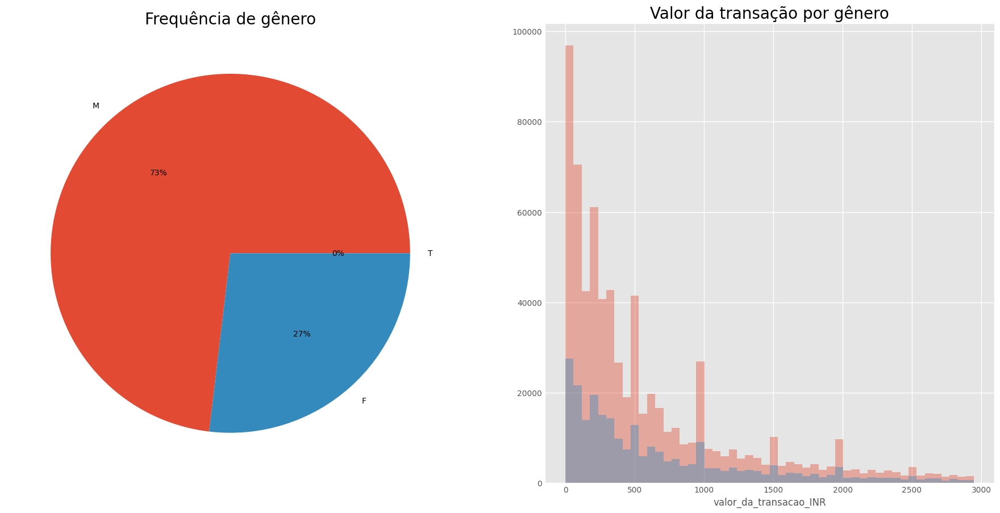

In [158]:
plt.style.use("ggplot")
fig,ax = plt.subplots(ncols=2,nrows=1,figsize=(20,10))

ax[0].pie(df3['genero'].value_counts(), autopct='%1.f%%',labels=['M','F','T'])
ax[0].set_title("Frequência de gênero", size = 20)

ax[1] = sns.distplot(df3.loc[(df3['genero'] == 'M')&(df3['valor_da_transacao_INR'] < np.percentile(df3['valor_da_transacao_INR'],90)), 
                      'valor_da_transacao_INR'],label = True, kde=False)

ax[1] = sns.distplot(df3.loc[(df3['genero'] == 'F')&(df3['valor_da_transacao_INR'] < np.percentile(df3['valor_da_transacao_INR'],90)), 
                      'valor_da_transacao_INR'], label = 'F', kde=False)
ax[1].set_title("Valor da transação por gênero", size = 20)

- O Gênero Masculino é o mais frequente nas transações, com 73%, e o Feminino com 27%.
- As transações no gênero Masculino são bem superiores a do gênero Feminino.

**Gênero e Faixas de Idade**

<Axes: xlabel='count', ylabel='idade_faixas'>

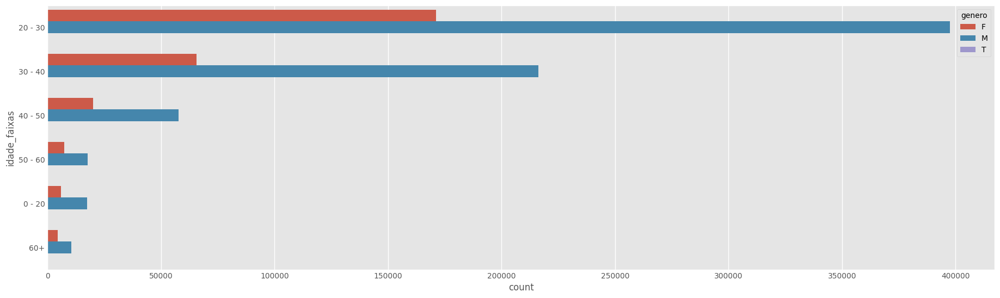

In [159]:
bins = [0, 20, 30, 40, 50, 60, 100]
labels = ['0 - 20', '20 - 30', '30 - 40', '40 - 50', '50 - 60', '60+']

df3['idade_faixas'] = pd.cut(x = df3['idade_em_2016'], bins = bins, labels = labels, right = True)

plt.figure(figsize=(20, 6))
sns.countplot(df3, y = 'idade_faixas', order = df3['idade_faixas'].value_counts().index, hue = 'genero')



- As Idades estão distribuidas com maior frequência entre 20 a 30 anos, com predominância dos homens.


**Concentração de Saldo da Conta e Concentração de Transações**

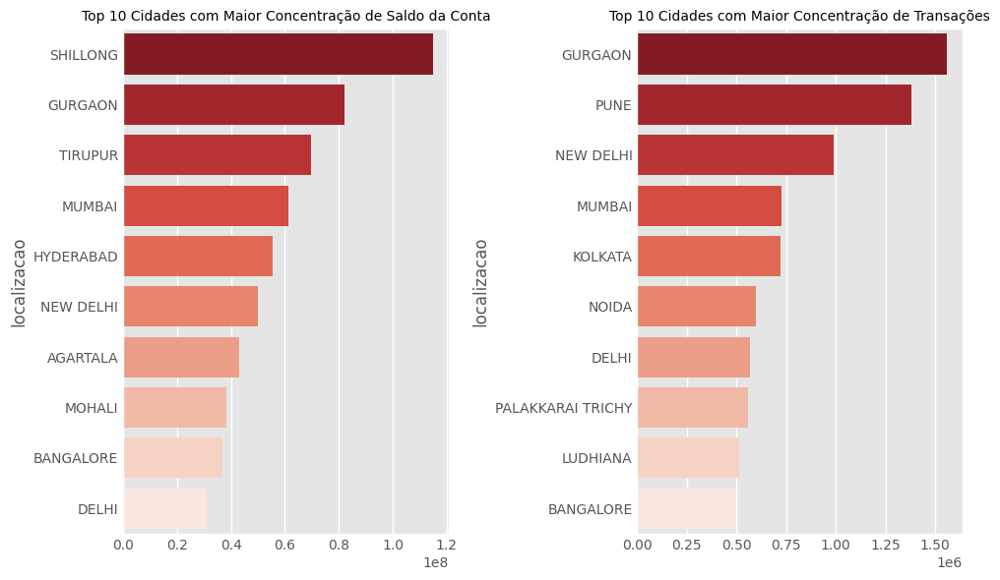

In [160]:
fig ,(ax1,ax2) = plt.subplots(nrows=1 , ncols=2 ,figsize=(10,6))

ax = sns.barplot(y=df3.groupby('localizacao')['saldo_da_conta'].max().sort_values(ascending=False)[:10].index ,
                x= df3.groupby('localizacao')['saldo_da_conta'].max().sort_values(ascending=False)[:10].values,
                ci=None,palette='Reds_r',ax=ax1)

ax.set_title('Top 10 Cidades com Maior Concentração de Saldo da Conta',
          fontsize='10',
          color='black');

ax = sns.barplot(y=df3.groupby('localizacao')['valor_da_transacao_INR'].max().sort_values(ascending=False)[:10].index ,
                x= df3.groupby('localizacao')['valor_da_transacao_INR'].max().sort_values(ascending=False)[:10].values,
                ci=None,palette='Reds_r',ax=ax2)


ax.set_title('Top 10 Cidades com Maior Concentração de Transações',
         fontsize='10',
          color='black');

plt.tight_layout()

- Shillong, Gurgaon e Tirupur são as 3 cidades com clientes com os maiores saldos na conta. 
- Gurgaon, Pune e Nova Delhi são as 3 primeiras cidades com as maiores concentrações de transações.|

**Distribuição de Transações por Dia e Distribuição de Transações por Mês**


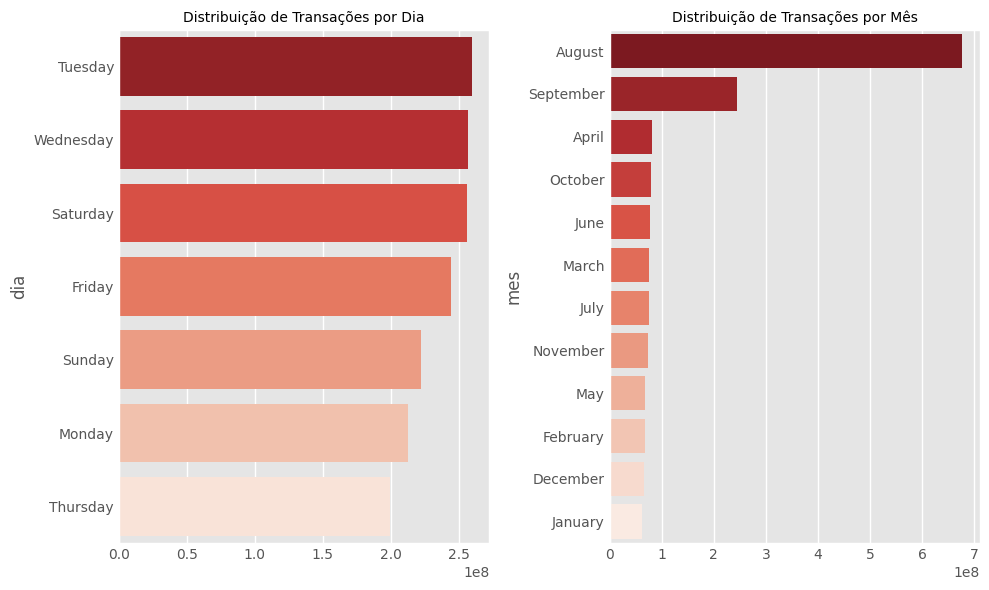

In [161]:
fig,(ax1,ax2)=plt.subplots(ncols=2,nrows=1,figsize=(10,6))

ax1= sns.barplot(  
          x = df3.groupby('dia')['valor_da_transacao_INR'].sum().sort_values(ascending=False).values, 
          y= df3.groupby('dia')['valor_da_transacao_INR'].sum().sort_values(ascending=False).index ,
          ci=None,palette='Reds_r' , ax=ax1
         )
    
ax1.set_title("Distribuição de Transações por Dia",size = 10, color='black')


ax2= sns.barplot(  
          x = df3.groupby('mes')['valor_da_transacao_INR'].sum().sort_values(ascending=False).values, 
          y= df3.groupby('mes')['valor_da_transacao_INR'].sum().sort_values(ascending=False).index,
          ci=None,palette='Reds_r' ,ax= ax2
         )

ax2.set_title("Distribuição de Transações por Mês" , size = 10, color='black' )

plt.tight_layout()

- Sábado, Quarta-Feira e Terça-Feira foram os 3 dias da semana com maior frequência de transações feitas.
- Agosto, Setembro e Abril foram os meses com as maiores frequências de transações.

In [162]:
df3.head()

,id_transacao,id_cliente,genero,localizacao,saldo_da_conta,data_da_transacao,valor_da_transacao_INR,periodo_do_dia_da_transacao,idade_em_2016,saldo_situacao,dia,mes,idade_faixas
0,T1,C5841053,F,JAMSHEDPUR,17819.05,2016-02-08,25.00,tarde,22.00,saldo_positivo,Monday,February,20 - 30
1,T2,C2142763,M,JHAJJAR,2270.69,2016-02-08,27999.00,tarde,59.00,saldo_negativo,Monday,February,50 - 60
2,T3,C4417068,F,MUMBAI,17874.44,2016-02-08,459.00,tarde,20.00,saldo_positivo,Monday,February,0 - 20
3,T4,C5342380,F,MUMBAI,866503.21,2016-02-08,2060.00,tarde,43.00,saldo_positivo,Monday,February,40 - 50
4,T5,C9031234,F,NAVI MUMBAI,6714.43,2016-02-08,1762.50,noite,28.00,saldo_positivo,Monday,February,20 - 30


**Distribuição de Transações pelas Faixas de Idade e Distribuição do Saldo da Conta pelas Faixas de Idade**


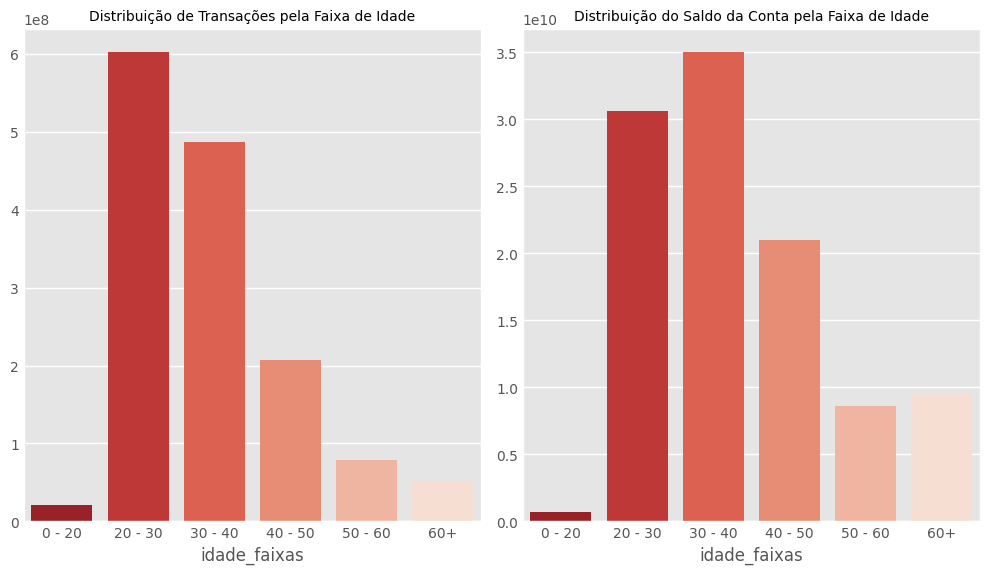

In [163]:
fig,(ax1,ax2)=plt.subplots(ncols=2,nrows=1,figsize=(10,6))

ax1= sns.barplot(  
          x = df3.groupby('idade_faixas')['valor_da_transacao_INR'].sum().sort_values(ascending=False).index, 
          y= df3.groupby('idade_faixas')['valor_da_transacao_INR'].sum().sort_values(ascending=False).values ,
          ci=None,palette='Reds_r' , ax=ax1
         )
    
ax1.set_title("Distribuição de Transações pela Faixa de Idade",size = 10, color='black')


ax2= sns.barplot(  
          x = df3.groupby('idade_faixas')['saldo_da_conta'].sum().sort_values(ascending=False).index, 
          y= df3.groupby('idade_faixas')['saldo_da_conta'].sum().sort_values(ascending=False).values,
          ci=None,palette='Reds_r' ,ax= ax2
         )

ax2.set_title("Distribuição do Saldo da Conta pela Faixa de Idade" , size = 10, color='black' )

plt.tight_layout()

### Método RFV ou RFM 

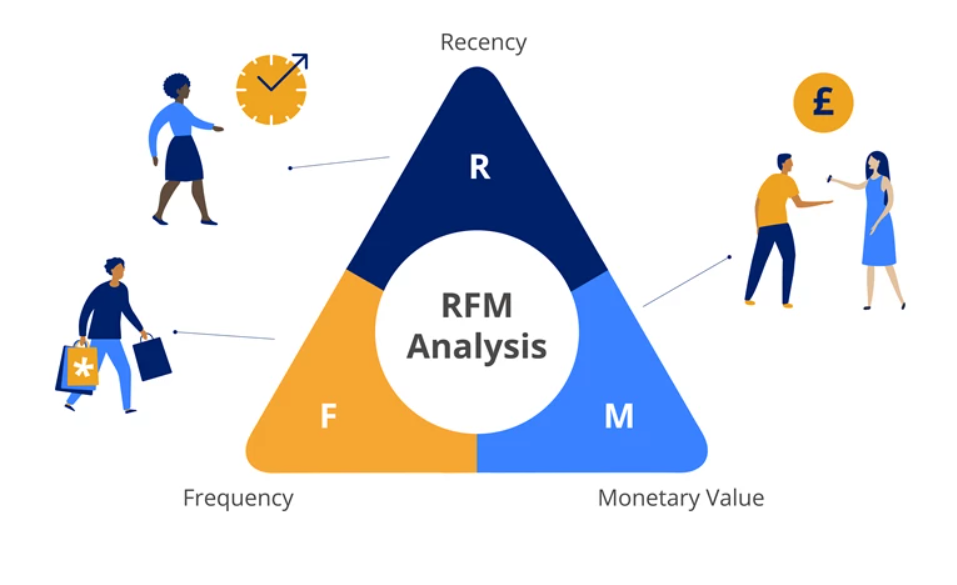

In [164]:
display.Image('../images/rfm_segmentation.png')

O método RFV (Recência, Frequência e Valor) é uma técnica de análise de clientes muito utilizada em marketing e vendas para identificar e segmentar os melhores clientes de uma empresa. Ele se baseia em três dimensões:

1. **Recência (R)**: Quanto tempo se passou desde a última compra do cliente? Clientes que compraram recentemente são mais propensos a responder a novas campanhas de marketing.

2. **Frequência (F)**: Quantas vezes o cliente comprou em um determinado período de tempo? Clientes que compram com mais frequência são geralmente mais valiosos.

3. **Valor (V)**: Quanto dinheiro o cliente gastou? Clientes que gastam mais dinheiro são considerados mais valiosos.


A análise RFV ajuda as empresas a identificar quais clientes merecem mais atenção e recursos, quais estão em risco de se tornarem inativos e quais estratégias podem ser mais eficazes para diferentes segmentos de clientes.

In [165]:
df3.head()

,id_transacao,id_cliente,genero,localizacao,saldo_da_conta,data_da_transacao,valor_da_transacao_INR,periodo_do_dia_da_transacao,idade_em_2016,saldo_situacao,dia,mes,idade_faixas
0,T1,C5841053,F,JAMSHEDPUR,17819.05,2016-02-08,25.00,tarde,22.00,saldo_positivo,Monday,February,20 - 30
1,T2,C2142763,M,JHAJJAR,2270.69,2016-02-08,27999.00,tarde,59.00,saldo_negativo,Monday,February,50 - 60
2,T3,C4417068,F,MUMBAI,17874.44,2016-02-08,459.00,tarde,20.00,saldo_positivo,Monday,February,0 - 20
3,T4,C5342380,F,MUMBAI,866503.21,2016-02-08,2060.00,tarde,43.00,saldo_positivo,Monday,February,40 - 50
4,T5,C9031234,F,NAVI MUMBAI,6714.43,2016-02-08,1762.50,noite,28.00,saldo_positivo,Monday,February,20 - 30


In [166]:
max_date = max(df3['data_da_transacao'])
max_date

Timestamp('2016-12-09 00:00:00')

In [167]:
rfm = df3.groupby('id_cliente').agg(max_data_de_transacao = ('data_da_transacao', 'max'),
                                    frequencia = ('id_transacao', 'nunique'),
                                    monetario = ('valor_da_transacao_INR', 'sum'))

In [168]:
rfm.head()

,max_data_de_transacao,frequencia,monetario
id_cliente,,,
C1010011,2016-09-26,2,5106.00
C1010012,2016-08-14,1,1499.00
C1010014,2016-07-08,2,1455.00
C1010018,2016-09-15,1,30.00
C1010024,2016-08-18,1,5000.00


In [169]:
rfm['recencia'] = (max_date - rfm['max_data_de_transacao']).dt.days

In [170]:
rfm.head()

,max_data_de_transacao,frequencia,monetario,recencia
id_cliente,,,,
C1010011,2016-09-26,2,5106.00,74
C1010012,2016-08-14,1,1499.00,117
C1010014,2016-07-08,2,1455.00,154
C1010018,2016-09-15,1,30.00,85
C1010024,2016-08-18,1,5000.00,113


In [171]:
rfm.drop(columns = ['max_data_de_transacao'], inplace = True)

### RFM Score

- A forma mais simples de criar segmentação de clientes a partir do Modelo RFM é utilizar os Quartis. Atribuímos uma pontuação de 1 a 5 para Recência, Frequência e Monetário. Cinco é o melhor/maior valor e um é o menor/pior valor. Uma pontuação RFM final é calculada simplesmente combinando números de pontuação RFM individuais.

In [172]:
# RFM Quartils

quartis = rfm.quantile(q = [0.20, 0.40, 0.60,0.80])
quartis

,frequencia,monetario,recencia
0.20,1.00,149.00,82.00
0.40,1.00,370.00,104.00
0.60,1.00,811.99,114.00
0.80,1.00,1943.97,184.00


- Criação do dicionário para colocar na função

In [173]:
quartis.to_dict()

{'frequencia': {0.2: 1.0, 0.4: 1.0, 0.6: 1.0, 0.8: 1.0},
 'monetario': {0.2: 149.0,
  0.4: 370.0,
  0.6: 811.9940000000003,
  0.8: 1943.9680000000028},
 'recencia': {0.2: 82.0, 0.4: 104.0, 0.6: 114.0, 0.8: 184.0}}

- Criação da Função Score
- Criaremos duas classes de segmentação, pois alta recência é ruim, enquanto alta frequência e valor monetário são bons.

In [174]:

def Rscore(x,p,d):
    if x <= d[p][0.20]:
        return 5
    elif x <= d[p][0.40]:
        return 4
    elif x <= d[p][0.60]:
        return 3
    elif x <= d[p][0.80]:
        return 2
    else:
        return 1


def FMscore(x,p,d):
    if x <= d[p][0.20]:
        return 1
    elif x <= d[p][0.40]:
        return 2
    elif x <= d[p][0.60]:
        return 3
    elif x <= d[p][0.80]:
        return 4
    else:
        return 5


- Criação das variáveis para depois implementar a função 

In [175]:
rfm['R_quartil'] = rfm['recencia'].apply(Rscore, args = ('recencia', quartis,))

rfm['F_quartil'] = rfm['frequencia'].apply(FMscore, args = ('frequencia', quartis,))

rfm['M_quartil'] = rfm['monetario'].apply(FMscore, args = ('monetario', quartis,))

In [176]:
rfm.head(20)

,frequencia,monetario,recencia,R_quartil,F_quartil,M_quartil
id_cliente,,,,,,
C1010011,2,5106.00,74,5,5,5
C1010012,1,1499.00,117,2,1,4
C1010014,2,1455.00,154,2,5,4
C1010018,1,30.00,85,4,1,1
C1010024,1,5000.00,113,3,1,5
C1010028,1,557.00,102,4,1,3
C1010031,2,1864.00,245,1,5,4
C1010035,2,750.00,104,4,5,3
C1010036,1,208.00,105,3,1,2


- Agora que temos a pontuação de cada cliente, podemos representar nossa segmentação de clientes. Primeiro, precisamos combinar as pontuações (R_Quartile, F_Quartile,M_Quartile).

In [177]:
# rfm['rfm_score'] = rfm.R_quartil.map(str) + rfm.F_quartil.map(str) + rfm.M_quartil.map(str)
rfm['rfm_score'] = rfm.R_quartil.map(str) + ((rfm.F_quartil + rfm.M_quartil) / 2).round().map(str)
rfm.head()

,frequencia,monetario,recencia,R_quartil,F_quartil,M_quartil,rfm_score
id_cliente,,,,,,,
C1010011,2,5106.00,74,5,5,5,55.0
C1010012,1,1499.00,117,2,1,4,22.0
C1010014,2,1455.00,154,2,5,4,24.0
C1010018,1,30.00,85,4,1,1,41.0
C1010024,1,5000.00,113,3,1,5,33.0


In [178]:
rfm['rfm_score'].unique()

array(['55.0', '22.0', '24.0', '41.0', '33.0', '42.0', '14.0', '44.0',
       '32.0', '43.0', '21.0', '12.0', '45.0', '13.0', '52.0', '53.0',
       '23.0', '11.0', '25.0', '51.0', '31.0', '54.0', '34.0', '35.0',
       '15.0'], dtype=object)

- Seria interessante mudar os valores combinados no rfm_score para nomes de categorias:
    - Ex:
    - otimo para a combinação 55.
    - regular para a combinação diferente de 55 e 11.
    - ruim para a combinação 11.

In [179]:
# rfm.loc[(rfm['rfm_score'] != '444') & (rfm['rfm_score'] != '111'), 'rfm_score'] = 'regular'
# rfm.loc[rfm['rfm_score'] == '444', 'rfm_score'] = 'otimo'
# rfm.loc[rfm['rfm_score'] == '111', 'rfm_score'] = 'ruim'

rfm.loc[(rfm['rfm_score'] == '11.0') | (rfm['rfm_score'] == '22.0') | (rfm['rfm_score'] == '12.0') | (rfm['rfm_score'] == '21.0'), 'rfm_score'] = 'hibernando'
rfm.loc[(rfm['rfm_score'] == '31.0') | (rfm['rfm_score'] == '32.0'), 'rfm_score'] = 'prestes a dormir'
rfm.loc[(rfm['rfm_score'] == '41.0'), 'rfm_score'] = 'promissores'
rfm.loc[rfm['rfm_score'] == '51.0', 'rfm_score'] = 'novos clientes'
rfm.loc[(rfm['rfm_score'] == '13.0') | (rfm['rfm_score'] == '14.0') | (rfm['rfm_score'] == '23.0') | (rfm['rfm_score'] == '24.0'), 'rfm_score'] = 'em risco'
rfm.loc[(rfm['rfm_score'] == '15.0') | (rfm['rfm_score'] == '25.0'), 'rfm_score'] = 'nao posso perde-los'
rfm.loc[(rfm['rfm_score'] == '34.0') | (rfm['rfm_score'] == '35.0') | (rfm['rfm_score'] == '44.0') | (rfm['rfm_score'] == '45.0'), 'rfm_score'] = 'clientes fieis'
rfm.loc[(rfm['rfm_score'] == '33.0'), 'rfm_score'] = 'precisam de atencao'
rfm.loc[(rfm['rfm_score'] == '42.0') | (rfm['rfm_score'] == '43.0') | (rfm['rfm_score'] == '52.0') | (rfm['rfm_score'] == '53.0'), 'rfm_score'] = 'possiveis clientes fieis'
rfm.loc[(rfm['rfm_score'] == '54.0') | (rfm['rfm_score'] == '55.0'), 'rfm_score'] = 'campeoes'




- Conferir os valores únicos

In [180]:
rfm['rfm_score'].unique()

array(['campeoes', 'hibernando', 'em risco', 'promissores',
       'precisam de atencao', 'possiveis clientes fieis',
       'clientes fieis', 'prestes a dormir', 'nao posso perde-los',
       'novos clientes'], dtype=object)

In [181]:
rfm.head()

,frequencia,monetario,recencia,R_quartil,F_quartil,M_quartil,rfm_score
id_cliente,,,,,,,
C1010011,2,5106.00,74,5,5,5,campeoes
C1010012,1,1499.00,117,2,1,4,hibernando
C1010014,2,1455.00,154,2,5,4,em risco
C1010018,1,30.00,85,4,1,1,promissores
C1010024,1,5000.00,113,3,1,5,precisam de atencao


- Cópia do dataset e drop das colunas desnecessárias, finalizando com um merge para df4 final

In [182]:
df4 = df3.copy()
rfm.drop(columns = ['R_quartil', 'F_quartil', 'M_quartil'], inplace = True)
df4 = pd.merge(df4, rfm, on = 'id_cliente', how = 'inner')

In [183]:
df4.shape

(1048567, 17)

In [184]:
df4.head()

,id_transacao,id_cliente,genero,localizacao,saldo_da_conta,data_da_transacao,valor_da_transacao_INR,periodo_do_dia_da_transacao,idade_em_2016,saldo_situacao,dia,mes,idade_faixas,frequencia,monetario,recencia,rfm_score
0,T1,C5841053,F,JAMSHEDPUR,17819.05,2016-02-08,25.00,tarde,22.00,saldo_positivo,Monday,February,20 - 30,1,25.00,305,hibernando
1,T2,C2142763,M,JHAJJAR,2270.69,2016-02-08,27999.00,tarde,59.00,saldo_negativo,Monday,February,50 - 60,1,27999.00,305,em risco
2,T3,C4417068,F,MUMBAI,17874.44,2016-02-08,459.00,tarde,20.00,saldo_positivo,Monday,February,0 - 20,1,459.00,305,hibernando
3,T4,C5342380,F,MUMBAI,866503.21,2016-02-08,2060.00,tarde,43.00,saldo_positivo,Monday,February,40 - 50,2,2938.40,118,nao posso perde-los
4,T5,C9031234,F,NAVI MUMBAI,6714.43,2016-02-08,1762.50,noite,28.00,saldo_positivo,Monday,February,20 - 30,1,1762.50,305,hibernando


### Clustering

- Criação de pequena amostra para geração do Dendrograma, utilize essa quantidade, se utilizar o tamanho normal, irá travar o processamento.

In [185]:
df4 = df4.sample(n = 10000)

- Criação de variável com as features do RFM

In [186]:
df_rfm = df4[['recencia', 'frequencia', 'monetario']]
df_rfm.head()

,recencia,frequencia,monetario
244187,113,2,3685.52
771042,183,1,100.00
804211,31,2,250.00
197038,92,1,50.00
714988,275,1,110.00


### Padronização

In [187]:
df_rfm_scaled = RobustScaler().fit_transform(df_rfm)
df_rfm_scaled = pd.DataFrame(df_rfm_scaled, columns=df_rfm.columns)
df_rfm_scaled.head()

,recencia,frequencia,monetario
0,0.16,1.00,1.91
1,2.00,0.00,-0.35
2,-2.00,1.00,-0.26
3,-0.39,0.00,-0.38
4,4.42,0.00,-0.34


### Dendrograma

- Dendrograma método Single Linkage

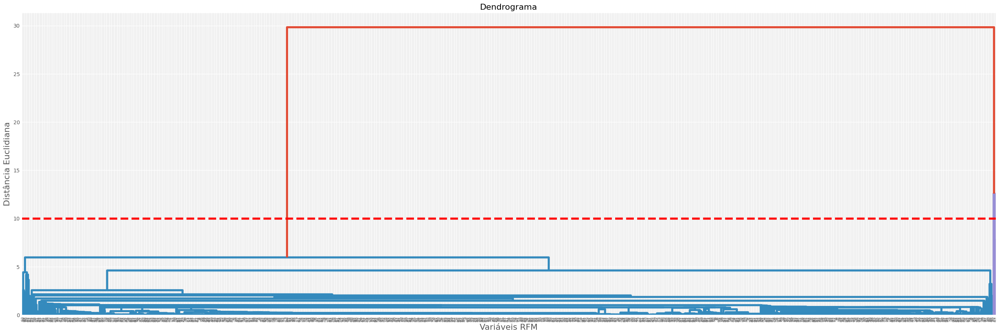

In [188]:
plt.figure(figsize=(30,10))
dendrograma = sch.linkage(df_rfm_scaled.iloc[:1000, :], method='single', metric='euclidean')
sch.dendrogram(dendrograma)
plt.title('Dendrograma', fontsize = 16)
plt.xlabel('Variáveis RFM', fontsize = 16)
plt.ylabel('Distância Euclidiana', fontsize = 16)
plt.axhline(y = 10, color = 'red', linestyle = '--')
plt.show()

- Dendrograma método Complete Linkage

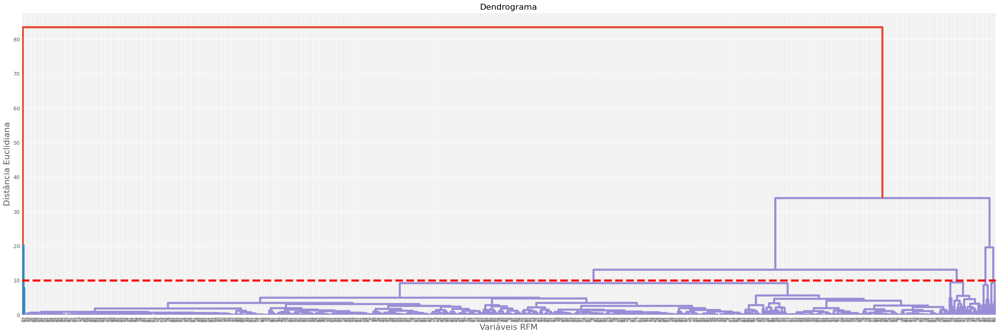

In [189]:
plt.figure(figsize=(30,10))
dendrograma = sch.linkage(df_rfm_scaled.iloc[:1000, :], method='complete', metric='euclidean')
sch.dendrogram(dendrograma)
plt.title('Dendrograma', fontsize = 16)
plt.xlabel('Variáveis RFM', fontsize = 16)
plt.ylabel('Distância Euclidiana', fontsize = 16)
plt.axhline(y = 10, color = 'red', linestyle = '--')
plt.show()

- Dendrograma método Average Linkage

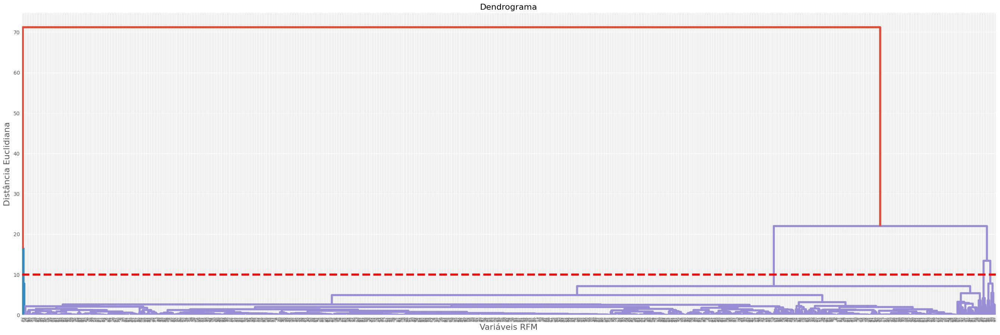

In [190]:
plt.figure(figsize=(30,10))
dendrograma = sch.linkage(df_rfm_scaled.iloc[:1000, :], method='average', metric='euclidean')
sch.dendrogram(dendrograma)
plt.title('Dendrograma', fontsize = 16)
plt.xlabel('Variáveis RFM', fontsize = 16)
plt.ylabel('Distância Euclidiana', fontsize = 16)
plt.axhline(y = 10, color = 'red', linestyle = '--')
plt.show()

### Cluster Aglomerativo

- Criação dos Clusters Aglomerativos com os 3 tipos de encadeamento

In [191]:
# SINGLE 
agglo_clustering_single = AgglomerativeClustering(n_clusters=3, metric = 'euclidean', linkage='single')
indica_cluster_single = agglo_clustering_single.fit_predict(df_rfm_scaled)
df4['cluster_agglo_single'] = indica_cluster_single
df4['cluster_agglo_single'] = df4['cluster_agglo_single'].astype('category')

In [192]:
# COMPLETE
agglo_clustering_complete = AgglomerativeClustering(n_clusters=3, metric = 'euclidean', linkage='complete')
indica_cluster_complete = agglo_clustering_complete.fit_predict(df_rfm_scaled)
df4['cluster_agglo_complete'] = indica_cluster_complete
df4['cluster_agglo_complete'] = df4['cluster_agglo_complete'].astype('category')

In [193]:
# AVERAGE
agglo_clustering_average = AgglomerativeClustering(n_clusters=3, metric = 'euclidean', linkage='average')
indica_cluster_average = agglo_clustering_average.fit_predict(df_rfm_scaled)
df4['cluster_agglo_average'] = indica_cluster_average
df4['cluster_agglo_average'] = df4['cluster_agglo_average'].astype('category')

In [194]:
df4.head()

,id_transacao,id_cliente,genero,localizacao,saldo_da_conta,data_da_transacao,valor_da_transacao_INR,periodo_do_dia_da_transacao,idade_em_2016,saldo_situacao,dia,mes,idade_faixas,frequencia,monetario,recencia,rfm_score,cluster_agglo_single,cluster_agglo_complete,cluster_agglo_average
244187,T244188,C7414448,M,DELHI,48260.66,2016-07-08,3226.00,noite,48.00,saldo_positivo,Friday,July,40 - 50,2,3685.52,113,clientes fieis,0,2,0
771042,T771043,C2510854,M,BANGALORE,130982.69,2016-06-09,100.00,noite,23.00,saldo_positivo,Thursday,June,20 - 30,1,100.00,183,hibernando,0,2,0
804211,T804212,C2338989,M,KOLKATA,134752.81,2016-05-09,100.00,noite,40.00,saldo_positivo,Monday,May,30 - 40,2,250.00,31,campeoes,0,2,0
197038,T197039,C5516426,F,GURGAON,510696.71,2016-09-08,50.00,manha,31.00,saldo_positivo,Thursday,September,30 - 40,1,50.00,92,promissores,0,2,0
714988,T714989,C2310525,F,PUNE,40.34,2016-03-09,110.00,noite,31.00,saldo_negativo,Wednesday,March,30 - 40,1,110.00,275,hibernando,0,2,0


- Contagem de Valores dos 3 tipos de Encadeamento

In [195]:
df4.cluster_agglo_single.value_counts()

cluster_agglo_single
0    9996
2       3
1       1
Name: count, dtype: int64

In [196]:
df4.cluster_agglo_complete.value_counts()

cluster_agglo_complete
2    9973
0      26
1       1
Name: count, dtype: int64

In [197]:
df4.cluster_agglo_average.value_counts()

cluster_agglo_average
0    9996
1       3
2       1
Name: count, dtype: int64

#### K-means

- Criação do Método do Cotovelo (Elbow Curve) para a geração dos Clusters com K-means

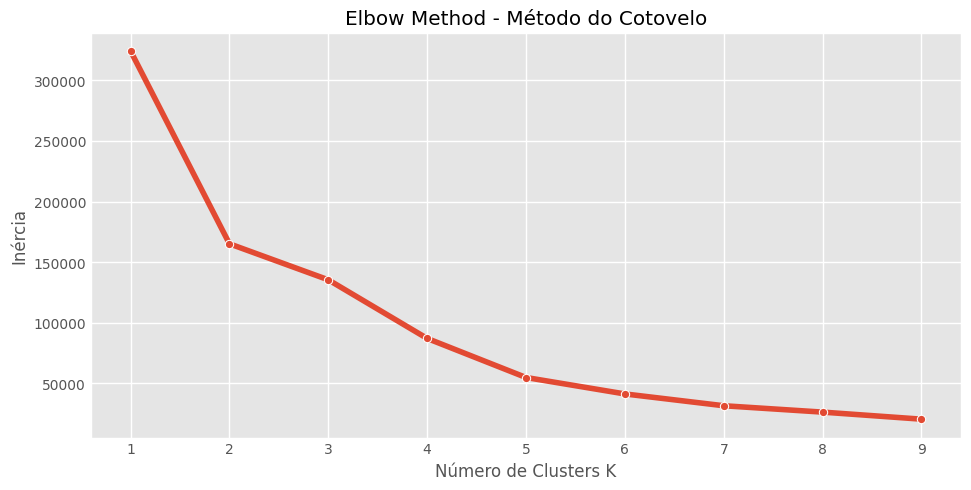

In [198]:
inercia = []
range_n_clusters = range(1,10)
for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters, init='k-means++', max_iter=300, random_state=42)
    kmeans.fit(df_rfm_scaled)

    inercia.append(kmeans.inertia_)

ig, ax = plt.subplots(figsize=(10,5))
sns.lineplot(y = inercia, x = range_n_clusters, marker = 'o', ax = ax)
plt.title('Elbow Method - Método do Cotovelo')
plt.xlabel('Número de Clusters K')
plt.ylabel('Inércia')
plt.show();

- Implementação do método KMeans com quantidade de grupos gerado no método elbow curve 

In [199]:
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, random_state=42)
kmeans.fit(df_rfm_scaled)

kmeans_clusters = kmeans.labels_
df4['cluster_kmeans'] = kmeans_clusters
df4['cluster_kmeans'] = df4['cluster_kmeans'].astype('category')

df4.head()

,id_transacao,id_cliente,genero,localizacao,saldo_da_conta,data_da_transacao,valor_da_transacao_INR,periodo_do_dia_da_transacao,idade_em_2016,saldo_situacao,...,mes,idade_faixas,frequencia,monetario,recencia,rfm_score,cluster_agglo_single,cluster_agglo_complete,cluster_agglo_average,cluster_kmeans
244187,T244188,C7414448,M,DELHI,48260.66,2016-07-08,3226.00,noite,48.00,saldo_positivo,...,July,40 - 50,2,3685.52,113,clientes fieis,0,2,0,0
771042,T771043,C2510854,M,BANGALORE,130982.69,2016-06-09,100.00,noite,23.00,saldo_positivo,...,June,20 - 30,1,100.00,183,hibernando,0,2,0,2
804211,T804212,C2338989,M,KOLKATA,134752.81,2016-05-09,100.00,noite,40.00,saldo_positivo,...,May,30 - 40,2,250.00,31,campeoes,0,2,0,0
197038,T197039,C5516426,F,GURGAON,510696.71,2016-09-08,50.00,manha,31.00,saldo_positivo,...,September,30 - 40,1,50.00,92,promissores,0,2,0,0
714988,T714989,C2310525,F,PUNE,40.34,2016-03-09,110.00,noite,31.00,saldo_negativo,...,March,30 - 40,1,110.00,275,hibernando,0,2,0,2


- Contagem dos Valores dos Clusters do KMeans

In [200]:
df4.cluster_kmeans.value_counts()

cluster_kmeans
0    7989
2    1918
1      89
3       4
Name: count, dtype: int64

- Centroids dos Clusters do KMeans

In [201]:
kmeans.cluster_centers_

array([[-4.64599350e-01,  4.24708975e-01,  6.85390641e-01],
       [ 2.39503253e-02,  5.84269663e-01,  3.67324470e+01],
       [ 3.88846660e+00,  9.17622523e-02,  4.25657994e-01],
       [ 8.28947368e-01,  2.50000000e-01,  1.53153008e+02]])

- Criação de agrupamento entre os Clusters KMeans x Variáveis Numéricas

In [202]:
numerical_features = df4.select_dtypes('number').columns.to_list()

grouped_clusters = df4.groupby(['cluster_kmeans'])[numerical_features].mean()
grouped_clusters.sort_values(['saldo_da_conta', 'monetario', 'frequencia', 'recencia'], ascending = False)

,saldo_da_conta,valor_da_transacao_INR,idade_em_2016,frequencia,monetario,recencia
cluster_kmeans,,,,,,
1,554508.12,45947.36,50.28,1.58,58839.20,107.91
3,362769.64,148645.50,36.75,1.25,243249.36,138.50
0,123926.47,1211.33,35.56,1.42,1740.66,89.35
2,102325.39,1211.44,34.62,1.09,1329.24,254.76


In [203]:
df4.head()

,id_transacao,id_cliente,genero,localizacao,saldo_da_conta,data_da_transacao,valor_da_transacao_INR,periodo_do_dia_da_transacao,idade_em_2016,saldo_situacao,...,mes,idade_faixas,frequencia,monetario,recencia,rfm_score,cluster_agglo_single,cluster_agglo_complete,cluster_agglo_average,cluster_kmeans
244187,T244188,C7414448,M,DELHI,48260.66,2016-07-08,3226.00,noite,48.00,saldo_positivo,...,July,40 - 50,2,3685.52,113,clientes fieis,0,2,0,0
771042,T771043,C2510854,M,BANGALORE,130982.69,2016-06-09,100.00,noite,23.00,saldo_positivo,...,June,20 - 30,1,100.00,183,hibernando,0,2,0,2
804211,T804212,C2338989,M,KOLKATA,134752.81,2016-05-09,100.00,noite,40.00,saldo_positivo,...,May,30 - 40,2,250.00,31,campeoes,0,2,0,0
197038,T197039,C5516426,F,GURGAON,510696.71,2016-09-08,50.00,manha,31.00,saldo_positivo,...,September,30 - 40,1,50.00,92,promissores,0,2,0,0
714988,T714989,C2310525,F,PUNE,40.34,2016-03-09,110.00,noite,31.00,saldo_negativo,...,March,30 - 40,1,110.00,275,hibernando,0,2,0,2


- Visualização gráfica relacional entre idade em 2016 e os valores de transação apenas como exemplo
- Dashboard será feito no Power BI

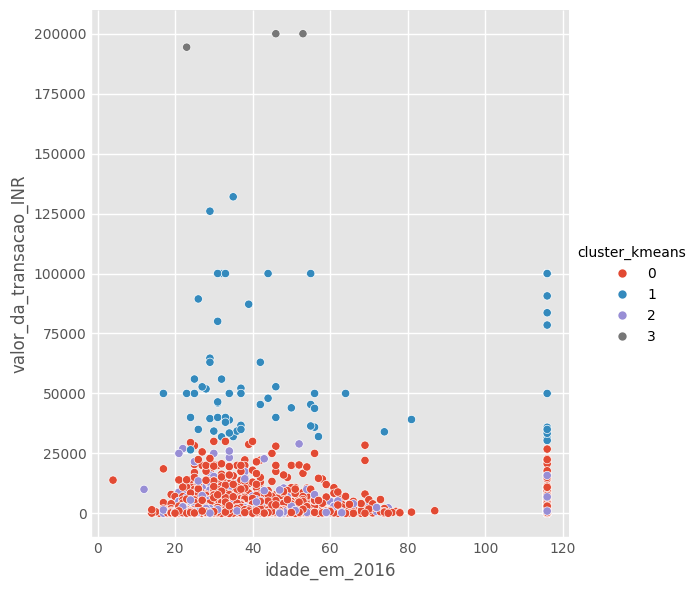

In [204]:
sns.relplot(
    x="idade_em_2016", y="valor_da_transacao_INR", hue="cluster_kmeans", data=df4, height=6,
);

- Criação do arquivo CSV apenas com a clusterização KMeans com todas as observações para o POWER BI

In [205]:
# df4.to_csv('../data/dataframe_clustering_kmeans.csv', index = False)

In [206]:
df4.rfm_score.unique()

array(['clientes fieis', 'hibernando', 'campeoes', 'promissores',
       'possiveis clientes fieis', 'prestes a dormir', 'em risco',
       'novos clientes', 'precisam de atencao', 'nao posso perde-los'],
      dtype=object)

In [207]:
df4[df4['rfm_score'] == 'novos clientes']

,id_transacao,id_cliente,genero,localizacao,saldo_da_conta,data_da_transacao,valor_da_transacao_INR,periodo_do_dia_da_transacao,idade_em_2016,saldo_situacao,...,mes,idade_faixas,frequencia,monetario,recencia,rfm_score,cluster_agglo_single,cluster_agglo_complete,cluster_agglo_average,cluster_kmeans
296350,T296351,C2430477,M,BANGALORE,4.94,2016-11-08,108.87,noite,29.00,saldo_negativo,...,November,20 - 30,1,108.87,31,novos clientes,0,2,0,0
316553,T316554,C7634131,M,THANE,17567.91,2016-10-08,25.00,noite,19.00,saldo_positivo,...,October,0 - 20,1,25.00,62,novos clientes,0,2,0,0
288040,T288041,C8365746,F,GURGAON,40112.62,2016-11-08,100.00,noite,24.00,saldo_positivo,...,November,20 - 30,1,100.00,31,novos clientes,0,2,0,0
950088,T950089,C1056633,M,DELHI,11426.40,2016-10-09,36.00,noite,27.00,saldo_positivo,...,October,20 - 30,1,36.00,61,novos clientes,0,2,0,0
926713,T926714,C8536123,F,GURGAON,2423.91,2016-11-09,24.00,tarde,26.00,saldo_positivo,...,November,20 - 30,1,24.00,30,novos clientes,0,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
926669,T926670,C3918146,M,NOIDA,2838.15,2016-11-09,97.00,manha,38.00,saldo_positivo,...,November,30 - 40,1,97.00,30,novos clientes,0,2,0,0
20901,T20902,C1628985,M,NEW DELHI,230049.71,2016-09-23,71.00,noite,25.00,saldo_positivo,...,September,20 - 30,1,71.00,77,novos clientes,0,2,0,0
951842,T951843,C8210811,M,NARNAUL,734.39,2016-10-09,100.00,noite,37.00,saldo_positivo,...,October,30 - 40,1,100.00,61,novos clientes,0,2,0,0
281005,T281006,C1342252,M,BHILAI,13328.18,2016-11-08,100.00,tarde,23.00,saldo_positivo,...,November,20 - 30,1,100.00,31,novos clientes,0,2,0,0


In [208]:
df4.id_cliente.value_counts()

id_cliente
C6815989    2
C6125379    2
C2338989    2
C4740375    2
C8210158    2
           ..
C6822528    1
C1011471    1
C8999971    1
C1912016    1
C6466584    1
Name: count, Length: 9975, dtype: int64

In [209]:
df4.id_cliente.nunique()

9975

In [210]:
df4.id_transacao.nunique()

10000

In [211]:
df4.rfm_score.unique()

array(['clientes fieis', 'hibernando', 'campeoes', 'promissores',
       'possiveis clientes fieis', 'prestes a dormir', 'em risco',
       'novos clientes', 'precisam de atencao', 'nao posso perde-los'],
      dtype=object)